<a href="https://colab.research.google.com/github/Noruzzang/Aiffelthon_qfit/blob/main/test_src/YYY(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


0: 736x1280 1 frame, 1 red ball, 1 table, 1 white ball, 1 yellow ball, 1510.2ms
Speed: 17.3ms preprocess, 1510.2ms inference, 1.4ms postprocess per image at shape (1, 3, 736, 1280)


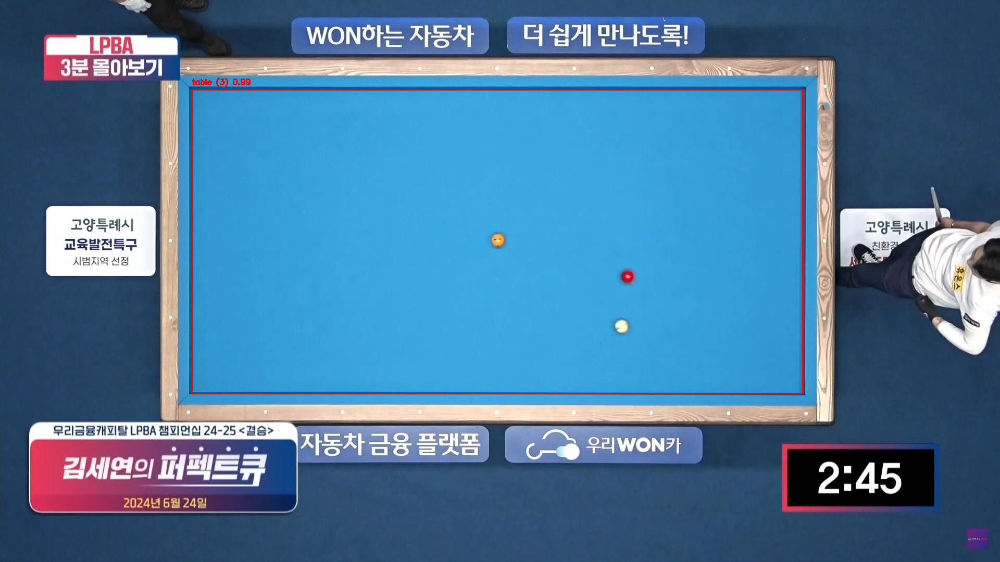

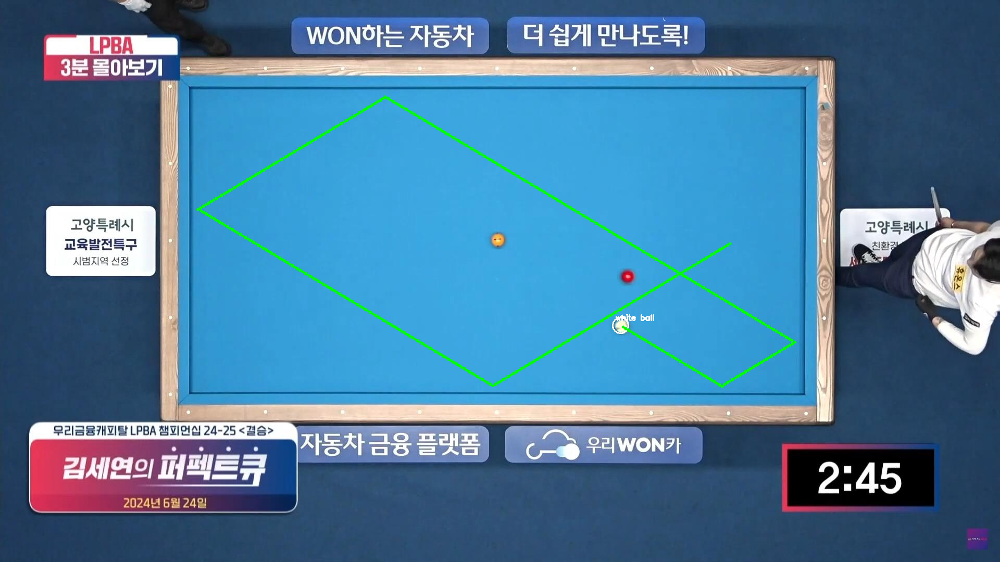

In [6]:
import cv2
from ultralytics import YOLO  # YOLOv8 객체 탐지 라이브러리
import pymunk
from pymunk import Vec2d
from google.colab.patches import cv2_imshow  # Colab 환경에서 이미지를 표시하기 위한 라이브러리

# YOLO 모델 로드
model = YOLO("JJJ.pt")
image_path = 'MMM.jpg'
image = cv2.imread(image_path)

# 서버에서 공 정보를 기준으로 설정
process_ball_info = "white ball" #"yellow ball"  # 서버에서 전달받은 공 종류 정보

# YOLO 모델로 이미지 분석
results = model(image)
class_names = model.names  # 모델에 저장된 클래스 이름들

# 이미지 복사본 생성 (결과 표시용)
output_image = image.copy()

# 테이블 박스 초기화
table_box = None

# YOLO 결과에서 테이블과 공 탐지
for detection in results[0].boxes:
    box = detection.xyxy[0].tolist()  # [x1, y1, x2, y2] 형태의 바운딩 박스 좌표
    class_id = int(detection.cls[0])  # 탐지된 객체의 클래스 ID
    confidence = detection.conf[0]  # 탐지 신뢰도
    class_name = class_names[class_id]  # 클래스 이름

    # 테이블 객체 탐지
    if class_name == "table":
        table_box = box  # 테이블 박스 설정
        cv2.rectangle(output_image, (int(box[0]), int(box[1])), (int(box[2]), int(box[3])), (0, 0, 255), 2)
        text = f"{class_name} ({class_id}) {confidence:.2f}"
        cv2.putText(output_image, text, (int(box[0]), int(box[1] - 10)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)

# 탐지된 결과를 화면에 표시
cv2_imshow(output_image)

# 공 탐지 및 그리기 함수
def detector_org_cuball(image, target_ball_info):
    """
    이미지에서 지정된 공(target_ball_info)을 탐지하여 위치와 반지름 반환,
    탐지된 공을 이미지 위에 그림.
    """
    color_map = {
        "yellow ball": (0, 255, 255),  # 노란색 (BGR)
        "white ball": (255, 255, 255)  # 흰색 (BGR)
    }

    for detection in results[0].boxes:
        box = detection.xyxy[0].tolist()  # 바운딩 박스 좌표 [x1, y1, x2, y2]
        class_id = int(detection.cls[0])  # 클래스 ID
        class_name = class_names[class_id]  # 탐지된 클래스 이름

        if class_name == target_ball_info:  # 지정된 공과 일치하는 경우
            x = int((box[0] + box[2]) // 2)  # 중심 X 좌표
            y = int((box[1] + box[3]) // 2)  # 중심 Y 좌표
            radius = int((box[2] - box[0]) // 2)  # 반지름

            # 공을 이미지 위에 그림
            if target_ball_info in color_map:
                cv2.circle(image, (x, y), radius, color_map[target_ball_info], 2)  # 원형 테두리 그림
                cv2.putText(image, f"{target_ball_info}", (x - 10, y - 10), cv2.FONT_HERSHEY_SIMPLEX,
                            0.5, color_map[target_ball_info], 2)  # 텍스트 추가

            return (x, y), radius  # 탐지된 공의 위치와 반지름 반환

    return None, None  # 공을 탐지하지 못한 경우


# Pymunk 물리 엔진 초기화
def setup_physics(space, table_box):
    """
    Pymunk 공간 초기화 및 테이블 벽 정의
    """
    space.gravity = (0, 0)  # 중력 비활성화
    t_x1, t_y1, t_x2, t_y2 = map(int, table_box)

    # 테이블의 네 벽 정의
    static_lines = [
        pymunk.Segment(space.static_body, (t_x1, t_y1), (t_x2, t_y1), 1),  # 상단 벽
        pymunk.Segment(space.static_body, (t_x1, t_y1), (t_x1, t_y2), 1),  # 좌측 벽
        pymunk.Segment(space.static_body, (t_x2, t_y1), (t_x2, t_y2), 1),  # 우측 벽
        pymunk.Segment(space.static_body, (t_x1, t_y2), (t_x2, t_y2), 1),  # 하단 벽
    ]

    for line in static_lines:
        line.elasticity = 1.0  # 반발 계수 설정
        space.add(line)

# 경로 시뮬레이션 함수
def simulate_bounce_path(space, start_pos, radius_new, velocity, table_box, max_bounces):
    """
    지정된 공의 경로를 시뮬레이션하고 경로 점 반환
    """
    body = pymunk.Body(mass=1, moment=10)
    body.position = start_pos
    body.velocity = velocity
    ball = pymunk.Circle(body, radius_new)
    ball.elasticity = 1.0
    space.add(body, ball)

    trajectory_points = []
    bounces = 0

    # 시뮬레이션 진행
    for _ in range(500):  # 최대 1000번 반복
        space.step(0.01)  # 시간 단위 진행
        trajectory_points.append((int(body.position.x), int(body.position.y)))

        # 공이 벽에 부딪힌 경우
        if (body.position.x <= 0 or body.position.x >= table_box[2] or
            body.position.y <= 0 or body.position.y >= table_box[3]):
            bounces += 1
        if bounces >= max_bounces:  # 최대 튕김 횟수 초과 시 종료
            break

    return trajectory_points

# Pymunk 공간 생성
space = pymunk.Space()
if table_box:
    setup_physics(space, table_box)

# 서버에서 설정한 공을 기준으로 탐지 및 경로 계산
start_pos, radius_new = detector_org_cuball(image, process_ball_info)
if start_pos:
    trajectory = simulate_bounce_path(space, start_pos, radius_new, (500, 300), list(map(int, table_box)), 4)

    # 계산된 경로를 이미지에 그리기
    for point in trajectory:
        cv2.circle(image, point, 3, (0, 255, 0), -1)  # 초록색 점으로 경로 표시

cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Name: pymunk
Version: 6.10.0
Summary: Pymunk is a easy-to-use pythonic 2D physics library
Home-page: https://www.pymunk.org
Author: 
Author-email: Victor Blomqvist <vb@viblo.se>
License: 
Location: /usr/local/lib/python3.10/dist-packages
Requires: cffi
Required-by: 

0: 736x1280 1 frame, 1 red ball, 1 table, 1 white ball, 1 yellow ball, 1471.0ms
Speed: 15.5ms preprocess, 1471.0ms inference, 1.4ms postprocess per image at shape (1, 3, 736, 1280)


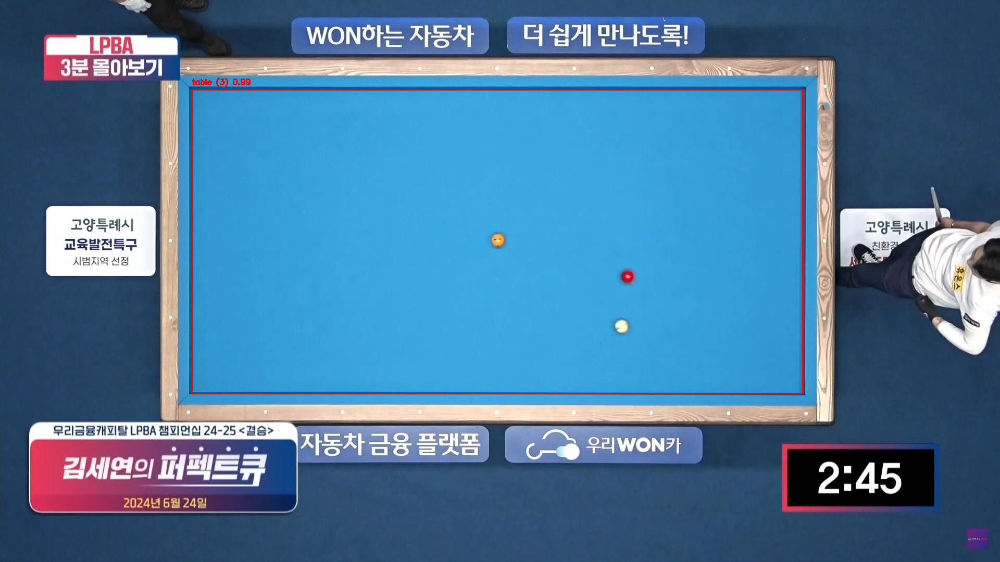

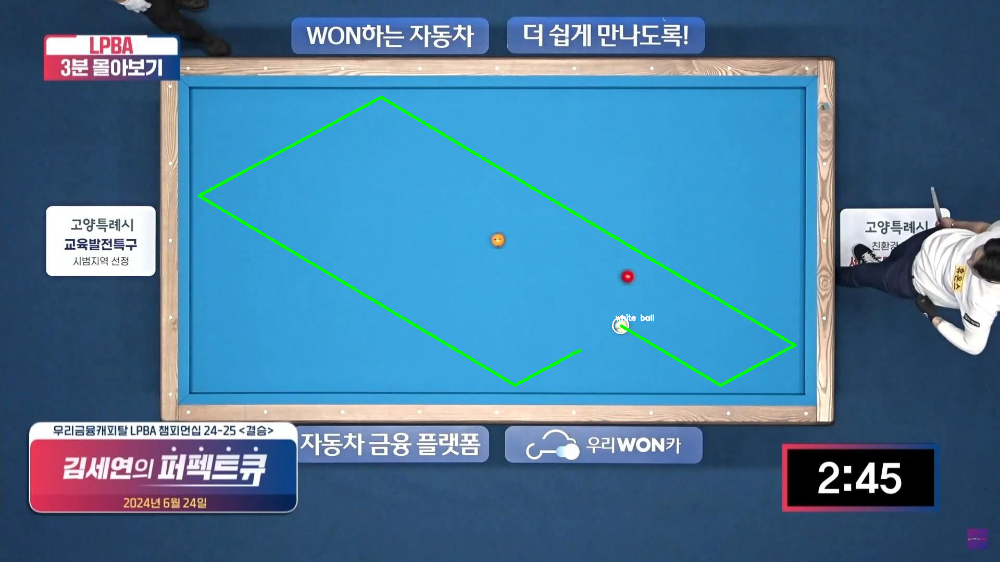

In [3]:
from google.colab import drive
drive.mount('/content/drive')


!pip install pymunk
!pip install ultralytics
!pip show pymunk


import cv2
from ultralytics import YOLO
import pymunk
from pymunk import Vec2d
from google.colab.patches import cv2_imshow

# YOLO 모델 로드 및 이미지 읽기
model = YOLO("JJJ.pt")
image_path = 'MMM.jpg'
image = cv2.imread(image_path)
process_ball_info = "white ball"

# YOLO 모델로 이미지 분석
results = model(image)
class_names = model.names
output_image = image.copy()

# 테이블 박스 초기화 및 탐지
table_box = None
for detection in results[0].boxes:
    box = detection.xyxy[0].tolist()
    class_id = int(detection.cls[0])
    confidence = detection.conf[0]
    class_name = class_names[class_id]
    if class_name == "table":
        table_box = box
        cv2.rectangle(output_image, (int(box[0]), int(box[1])), (int(box[2]), int(box[3])), (0, 0, 255), 2)
        text = f"{class_name} ({class_id}) {confidence:.2f}"
        cv2.putText(output_image, text, (int(box[0]), int(box[1] - 10)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)

cv2_imshow(output_image)

# 공 탐지 및 그리기 함수
def detector_org_cuball(image, target_ball_info):
    color_map = {
        "yellow ball": (0, 255, 255),
        "white ball": (255, 255, 255)
    }
    for detection in results[0].boxes:
        box = detection.xyxy[0].tolist()
        class_id = int(detection.cls[0])
        class_name = class_names[class_id]
        if class_name == target_ball_info:
            x = int((box[0] + box[2]) // 2)
            y = int((box[1] + box[3]) // 2)
            radius = int((box[2] - box[0]) // 2)
            if target_ball_info in color_map:
                cv2.circle(image, (x, y), radius, color_map[target_ball_info], 2)
                cv2.putText(image, f"{target_ball_info}", (x - 10, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color_map[target_ball_info], 2)
            return (x, y), radius
    return None, None

# Pymunk 물리 엔진 초기화
def setup_physics(space, table_box):
    space.gravity = (0, 0)
    t_x1, t_y1, t_x2, t_y2 = map(int, table_box)
    static_lines = [
        pymunk.Segment(space.static_body, (t_x1, t_y1), (t_x2, t_y1), 1),
        pymunk.Segment(space.static_body, (t_x1, t_y1), (t_x1, t_y2), 1),
        pymunk.Segment(space.static_body, (t_x2, t_y1), (t_x2, t_y2), 1),
        pymunk.Segment(space.static_body, (t_x1, t_y2), (t_x2, t_y2), 1),
    ]
    for line in static_lines:
        line.elasticity = 0.95  # 현실적인 반발 계수로 조정
        space.add(line)

# 경로 시뮬레이션 함수
def simulate_bounce_path(space, start_pos, radius_new, velocity, table_box, max_bounces):
    body = pymunk.Body(mass=1, moment=10)
    body.position = start_pos
    body.velocity = velocity
    ball = pymunk.Circle(body, radius_new)
    ball.elasticity = 0.95
    space.add(body, ball)
    trajectory_points = []
    bounces = 0
    for _ in range(1000):  # 더 긴 반복으로 경로 추적
        space.step(0.005)  # 더 작은 시간 단위로 시뮬레이션 정확도 증가
        trajectory_points.append((int(body.position.x), int(body.position.y)))
        if (body.position.x <= table_box[0] or body.position.x >= table_box[2] or
            body.position.y <= table_box[1] or body.position.y >= table_box[3]):
            bounces += 1
            if bounces >= max_bounces:
                break
    return trajectory_points

# Pymunk 공간 생성 및 시뮬레이션 실행
space = pymunk.Space()
if table_box:
    setup_physics(space, table_box)

start_pos, radius_new = detector_org_cuball(image, process_ball_info)
if start_pos:
    trajectory = simulate_bounce_path(space, start_pos, radius_new, (500, 300), list(map(int, table_box)), 4)
    for point in trajectory:
        cv2.circle(image, point, 3, (0, 255, 0), -1)

cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()



0: 736x1280 1 frame, 1 red ball, 1 table, 1 white ball, 1 yellow ball, 1434.9ms
Speed: 18.1ms preprocess, 1434.9ms inference, 1.3ms postprocess per image at shape (1, 3, 736, 1280)


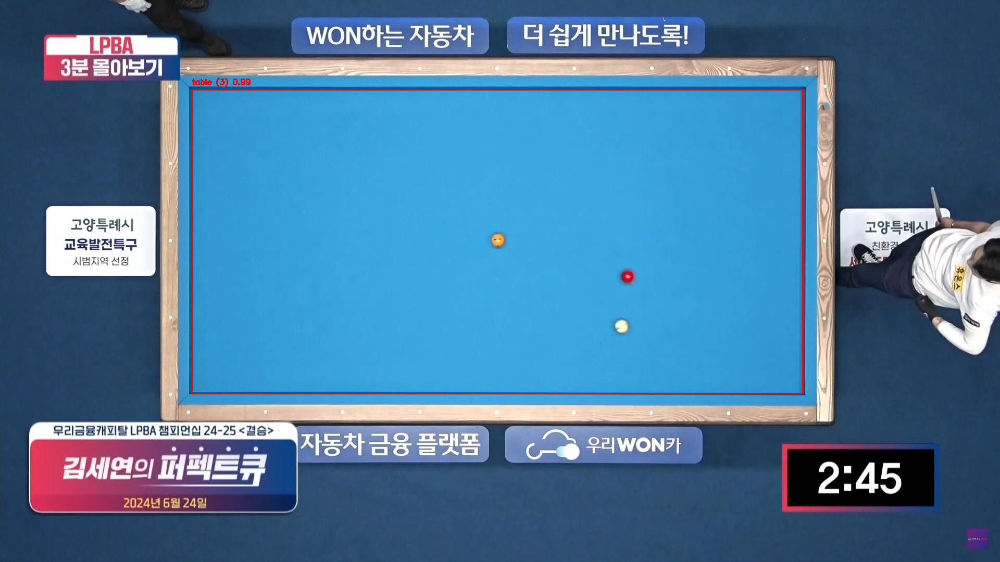

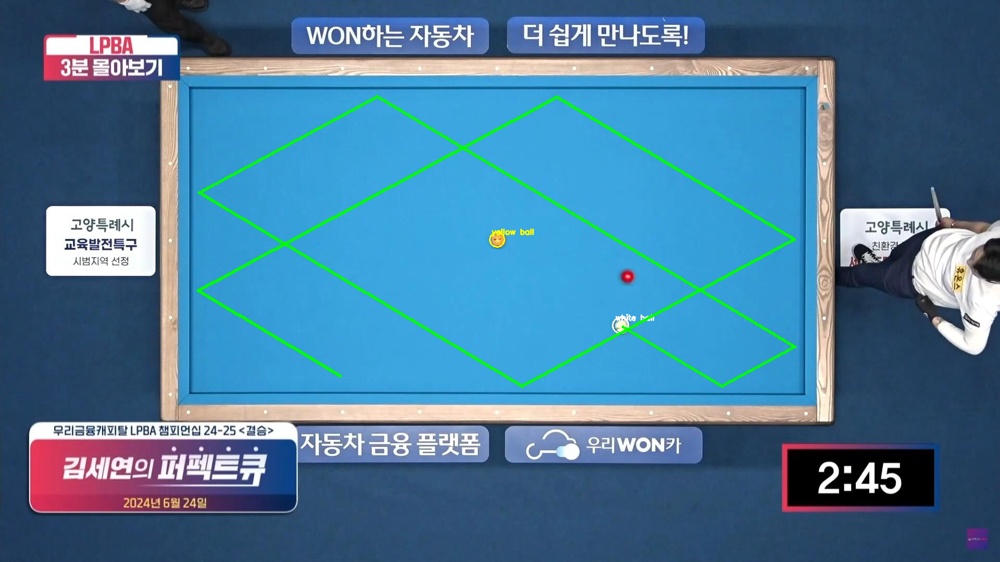

In [4]:
import cv2
from ultralytics import YOLO  # YOLOv8 객체 탐지 라이브러리
import pymunk
from pymunk import Vec2d
from google.colab.patches import cv2_imshow  # Colab 환경에서 이미지를 표시하기 위한 라이브러리

# YOLO 모델 로드
model = YOLO("JJJ.pt")
image_path = 'MMM.jpg'
image = cv2.imread(image_path)

# 서버에서 공 정보를 기준으로 설정
process_ball_info = "white ball"
target_ball_info = "yellow ball"

# YOLO 모델로 이미지 분석
results = model(image)
class_names = model.names  # 모델에 저장된 클래스 이름들

# 이미지 복사본 생성 (결과 표시용)
output_image = image.copy()

# 테이블 박스 초기화
table_box = None

# YOLO 결과에서 테이블과 공 탐지
for detection in results[0].boxes:
    box = detection.xyxy[0].tolist()
    class_id = int(detection.cls[0])
    confidence = detection.conf[0]
    class_name = class_names[class_id]

    if class_name == "table":
        table_box = box
        cv2.rectangle(output_image, (int(box[0]), int(box[1])), (int(box[2]), int(box[3])), (0, 0, 255), 2)
        text = f"{class_name} ({class_id}) {confidence:.2f}"
        cv2.putText(output_image, text, (int(box[0]), int(box[1] - 10)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)

cv2_imshow(output_image)

# 공 탐지 및 그리기 함수
def detector_org_cuball(image, target_ball_info):
    color_map = {
        "yellow ball": (0, 255, 255),
        "white ball": (255, 255, 255)
    }

    for detection in results[0].boxes:
        box = detection.xyxy[0].tolist()
        class_id = int(detection.cls[0])
        class_name = class_names[class_id]

        if class_name == target_ball_info:
            x = int((box[0] + box[2]) // 2)
            y = int((box[1] + box[3]) // 2)
            radius = int((box[2] - box[0]) // 2)

            if target_ball_info in color_map:
                cv2.circle(image, (x, y), radius, color_map[target_ball_info], 2)
                cv2.putText(image, f"{target_ball_info}", (x - 10, y - 10), cv2.FONT_HERSHEY_SIMPLEX,
                            0.5, color_map[target_ball_info], 2)

            return (x, y), radius

    return None, None

# Pymunk 물리 엔진 초기화
def setup_physics(space, table_box):
    space.gravity = (0, 0)
    t_x1, t_y1, t_x2, t_y2 = map(int, table_box)

    static_lines = [
        pymunk.Segment(space.static_body, (t_x1, t_y1), (t_x2, t_y1), 1),
        pymunk.Segment(space.static_body, (t_x1, t_y1), (t_x1, t_y2), 1),
        pymunk.Segment(space.static_body, (t_x2, t_y1), (t_x2, t_y2), 1),
        pymunk.Segment(space.static_body, (t_x1, t_y2), (t_x2, t_y2), 1),
    ]

    for line in static_lines:
        line.elasticity = 1.0
        space.add(line)

# Pymunk 공간 생성
space = pymunk.Space()
if table_box:
    setup_physics(space, table_box)

# 수구와 목적구 탐지
start_pos, radius_new = detector_org_cuball(image, process_ball_info)
target_pos, target_radius = detector_org_cuball(image, target_ball_info)

if start_pos and target_pos:
    # 수구 설정
    white_ball_body = pymunk.Body(mass=1, moment=10)
    white_ball_body.position = start_pos
    white_ball_body.velocity = (500, 300)
    white_ball = pymunk.Circle(white_ball_body, radius_new)
    white_ball.elasticity = 0.9
    space.add(white_ball_body, white_ball)

    # 목적구 설정
    target_ball_body = pymunk.Body(mass=1, moment=10)
    target_ball_body.position = target_pos
    target_ball = pymunk.Circle(target_ball_body, target_radius)
    target_ball.elasticity = 0.9
    space.add(target_ball_body, target_ball)

    # 시뮬레이션
    trajectory_points = []
    for _ in range(1000):
        space.step(0.01)
        trajectory_points.append((int(white_ball_body.position.x), int(white_ball_body.position.y)))

    # 경로 표시
    for point in trajectory_points:
        cv2.circle(image, point, 3, (0, 255, 0), -1)

cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()



0: 736x1280 1 frame, 1 red ball, 1 table, 1 white ball, 1 yellow ball, 1411.6ms
Speed: 12.8ms preprocess, 1411.6ms inference, 1.2ms postprocess per image at shape (1, 3, 736, 1280)


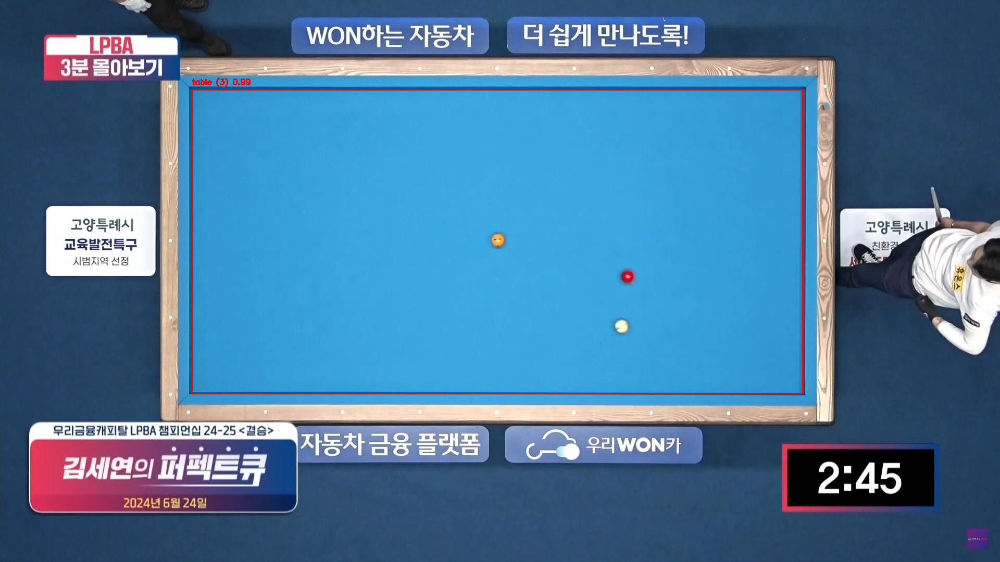

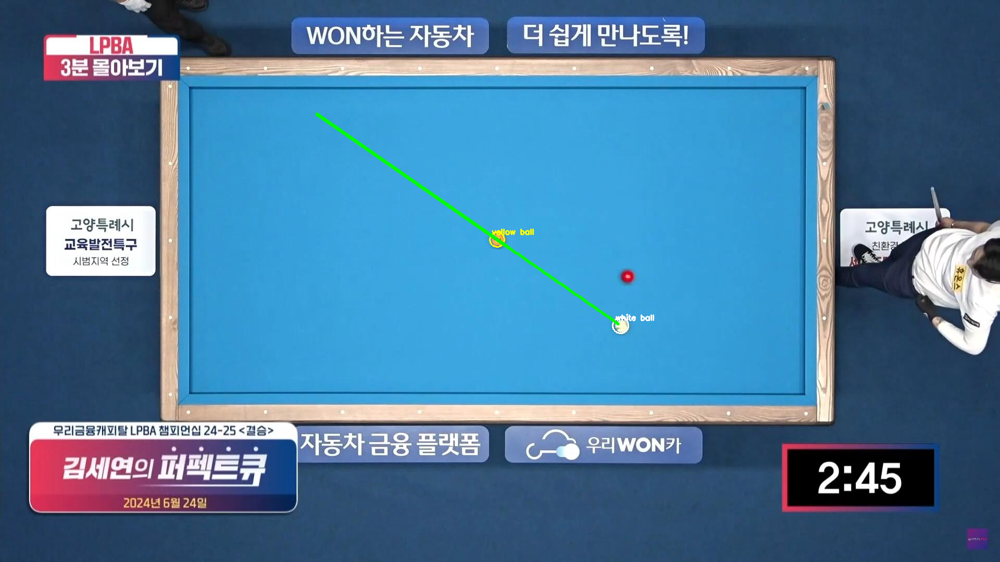

In [8]:
import cv2
from ultralytics import YOLO
import pymunk
from pymunk import Vec2d
from google.colab.patches import cv2_imshow

# YOLO 모델 로드
model = YOLO("JJJ.pt")
image_path = 'MMM.jpg'
image = cv2.imread(image_path)

# 서버에서 공 정보를 기준으로 설정
process_ball_info = "white ball"
target_ball_info = "yellow ball"

# YOLO 모델로 이미지 분석
results = model(image)
class_names = model.names

# 이미지 복사본 생성 (결과 표시용)
output_image = image.copy()

# 테이블 박스 초기화
table_box = None

# YOLO 결과에서 테이블과 공 탐지
for detection in results[0].boxes:
    box = detection.xyxy[0].tolist()
    class_id = int(detection.cls[0])
    confidence = detection.conf[0]
    class_name = class_names[class_id]

    if class_name == "table":
        table_box = box
        cv2.rectangle(output_image, (int(box[0]), int(box[1])), (int(box[2]), int(box[3])), (0, 0, 255), 2)
        text = f"{class_name} ({class_id}) {confidence:.2f}"
        cv2.putText(output_image, text, (int(box[0]), int(box[1] - 10)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)

cv2_imshow(output_image)

# 공 탐지 및 그리기 함수
def detector_org_cuball(image, target_ball_info):
    color_map = {
        "yellow ball": (0, 255, 255),
        "white ball": (255, 255, 255)
    }

    for detection in results[0].boxes:
        box = detection.xyxy[0].tolist()
        class_id = int(detection.cls[0])
        class_name = class_names[class_id]

        if class_name == target_ball_info:
            x = int((box[0] + box[2]) // 2)
            y = int((box[1] + box[3]) // 2)
            radius = int((box[2] - box[0]) // 2)

            if target_ball_info in color_map:
                cv2.circle(image, (x, y), radius, color_map[target_ball_info], 2)
                cv2.putText(image, f"{target_ball_info}", (x - 10, y - 10), cv2.FONT_HERSHEY_SIMPLEX,
                            0.5, color_map[target_ball_info], 2)

            return (x, y), radius

    return None, None

# Pymunk 물리 엔진 초기화
def setup_physics(space, table_box):
    space.gravity = (0, 0)
    t_x1, t_y1, t_x2, t_y2 = map(int, table_box)

    static_lines = [
        pymunk.Segment(space.static_body, (t_x1, t_y1), (t_x2, t_y1), 1),
        pymunk.Segment(space.static_body, (t_x1, t_y1), (t_x1, t_y2), 1),
        pymunk.Segment(space.static_body, (t_x2, t_y1), (t_x2, t_y2), 1),
        pymunk.Segment(space.static_body, (t_x1, t_y2), (t_x2, t_y2), 1),
    ]

    for line in static_lines:
        line.elasticity = 1.0
        space.add(line)

# Pymunk 공간 생성
space = pymunk.Space()
if table_box:
    setup_physics(space, table_box)

# 수구와 목적구 탐지
start_pos, radius_new = detector_org_cuball(image, process_ball_info)
target_pos, target_radius = detector_org_cuball(image, target_ball_info)

if start_pos and target_pos:
    # 수구 설정
    white_ball_body = pymunk.Body(mass=1, moment=10)
    white_ball_body.position = Vec2d(*start_pos)
    direction = Vec2d(*target_pos) - Vec2d(*start_pos)
    white_ball_body.velocity = direction.normalized() * 500
    white_ball = pymunk.Circle(white_ball_body, radius_new)
    white_ball.elasticity = 0.9
    space.add(white_ball_body, white_ball)

    # 목적구 설정
    target_ball_body = pymunk.Body(mass=1, moment=10)
    target_ball_body.position = Vec2d(*target_pos)
    target_ball = pymunk.Circle(target_ball_body, target_radius)
    target_ball.elasticity = 0.9
    space.add(target_ball_body, target_ball)

    # 시뮬레이션
    trajectory_points = []
    for _ in range(1000):
        space.step(0.01)
        trajectory_points.append((int(white_ball_body.position.x), int(white_ball_body.position.y)))

    # 경로 표시
    for point in trajectory_points:
        cv2.circle(image, point, 3, (0, 255, 0), -1)

cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()



0: 736x1280 1 frame, 1 red ball, 1 table, 1 white ball, 1 yellow ball, 1409.6ms
Speed: 14.3ms preprocess, 1409.6ms inference, 1.2ms postprocess per image at shape (1, 3, 736, 1280)


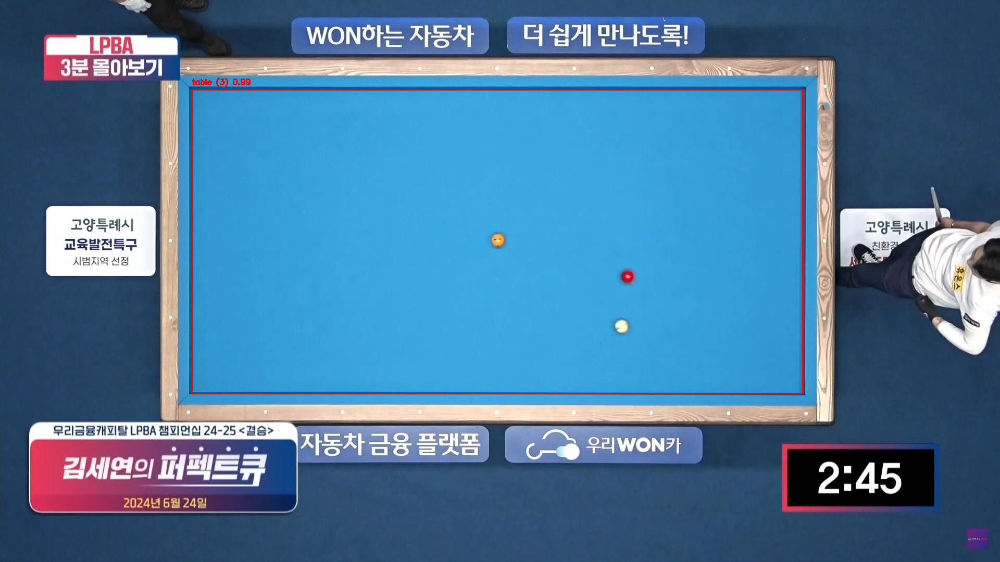

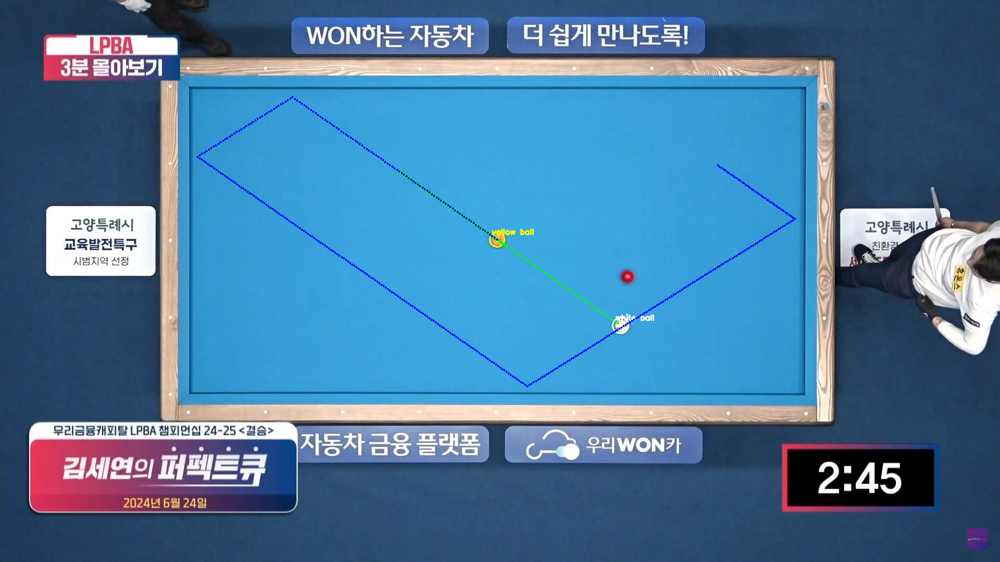

In [10]:
import cv2
from ultralytics import YOLO
import pymunk
from pymunk import Vec2d
from google.colab.patches import cv2_imshow

# YOLO 모델 로드
model = YOLO("JJJ.pt")
image_path = 'MMM.jpg'
image = cv2.imread(image_path)

# 서버에서 공 정보를 기준으로 설정
process_ball_info = "white ball"
target_ball_info = "yellow ball"

# YOLO 모델로 이미지 분석
results = model(image)
class_names = model.names

# 이미지 복사본 생성 (결과 표시용)
output_image = image.copy()

# 테이블 박스 초기화
table_box = None

# YOLO 결과에서 테이블과 공 탐지
for detection in results[0].boxes:
    box = detection.xyxy[0].tolist()
    class_id = int(detection.cls[0])
    confidence = detection.conf[0]
    class_name = class_names[class_id]

    if class_name == "table":
        table_box = box
        cv2.rectangle(output_image, (int(box[0]), int(box[1])), (int(box[2]), int(box[3])), (0, 0, 255), 2)
        text = f"{class_name} ({class_id}) {confidence:.2f}"
        cv2.putText(output_image, text, (int(box[0]), int(box[1] - 10)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)

cv2_imshow(output_image)

# 공 탐지 및 그리기 함수
def detector_org_cuball(image, target_ball_info):
    color_map = {
        "yellow ball": (0, 255, 255),
        "white ball": (255, 255, 255)
    }

    for detection in results[0].boxes:
        box = detection.xyxy[0].tolist()
        class_id = int(detection.cls[0])
        class_name = class_names[class_id]

        if class_name == target_ball_info:
            x = int((box[0] + box[2]) // 2)
            y = int((box[1] + box[3]) // 2)
            radius = int((box[2] - box[0]) // 2)

            if target_ball_info in color_map:
                cv2.circle(image, (x, y), radius, color_map[target_ball_info], 2)
                cv2.putText(image, f"{target_ball_info}", (x - 10, y - 10), cv2.FONT_HERSHEY_SIMPLEX,
                            0.5, color_map[target_ball_info], 2)

            return (x, y), radius

    return None, None

# Pymunk 물리 엔진 초기화
def setup_physics(space, table_box):
    space.gravity = (0, 0)
    t_x1, t_y1, t_x2, t_y2 = map(int, table_box)

    static_lines = [
        pymunk.Segment(space.static_body, (t_x1, t_y1), (t_x2, t_y1), 1),
        pymunk.Segment(space.static_body, (t_x1, t_y1), (t_x1, t_y2), 1),
        pymunk.Segment(space.static_body, (t_x2, t_y1), (t_x2, t_y2), 1),
        pymunk.Segment(space.static_body, (t_x1, t_y2), (t_x2, t_y2), 1),
    ]

    for line in static_lines:
        line.elasticity = 1.0
        space.add(line)

# Pymunk 공간 생성
space = pymunk.Space()
if table_box:
    setup_physics(space, table_box)

# 수구와 목적구 탐지
start_pos, radius_new = detector_org_cuball(image, process_ball_info)
target_pos, target_radius = detector_org_cuball(image, target_ball_info)

if start_pos and target_pos:
    # 수구 설정
    white_ball_body = pymunk.Body(mass=1, moment=10)
    white_ball_body.position = Vec2d(*start_pos)
    direction = Vec2d(*target_pos) - Vec2d(*start_pos)
    white_ball_body.velocity = direction.normalized() * 600
    white_ball = pymunk.Circle(white_ball_body, radius_new)
    white_ball.elasticity = 0.9
    white_ball.friction = 0.05
    space.add(white_ball_body, white_ball)

    # 목적구 설정
    target_ball_body = pymunk.Body(mass=1, moment=10)
    target_ball_body.position = Vec2d(*target_pos)
    target_ball = pymunk.Circle(target_ball_body, target_radius)
    target_ball.elasticity = 0.9
    target_ball.friction = 0.05
    space.add(target_ball_body, target_ball)

    # 시뮬레이션
    trajectory_points_white = []
    trajectory_points_target = []

    for _ in range(500):
        space.step(0.01)
        trajectory_points_white.append((int(white_ball_body.position.x), int(white_ball_body.position.y)))
        trajectory_points_target.append((int(target_ball_body.position.x), int(target_ball_body.position.y)))

    # 경로 표시
    for point in trajectory_points_white:
        cv2.circle(image, point, 2, (0, 255, 0), -1)
    for point in trajectory_points_target:
        cv2.circle(image, point, 2, (255, 0, 0), -1)

cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()



0: 736x1280 1 frame, 1 red ball, 1 table, 1 white ball, 1 yellow ball, 1409.4ms
Speed: 14.8ms preprocess, 1409.4ms inference, 1.2ms postprocess per image at shape (1, 3, 736, 1280)


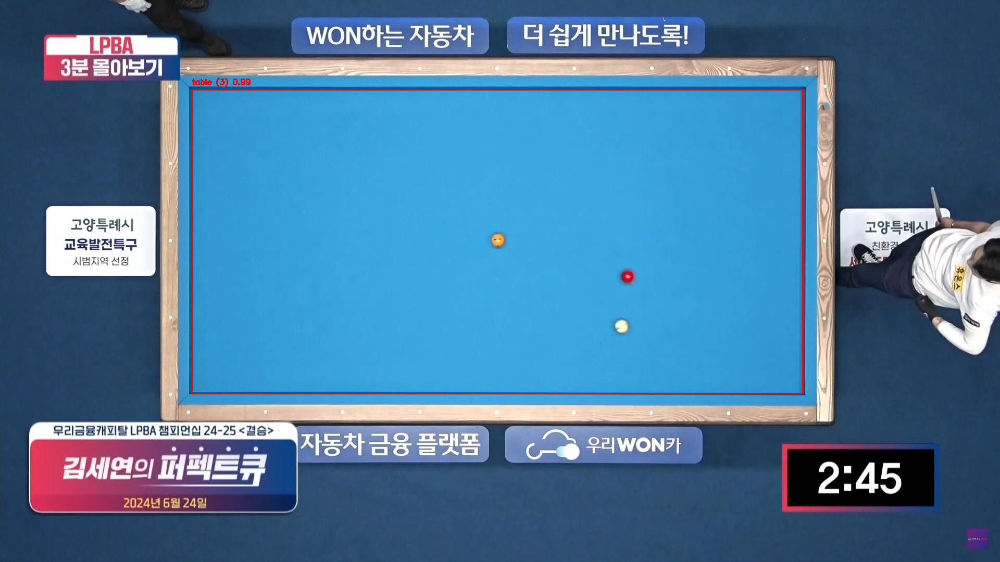

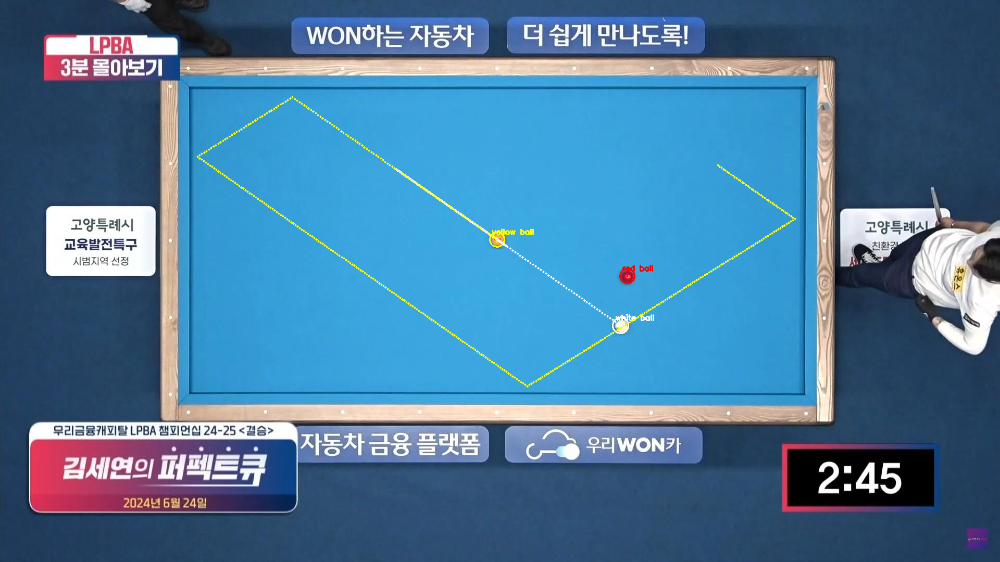

In [11]:
import cv2
from ultralytics import YOLO
import pymunk
from pymunk import Vec2d
from google.colab.patches import cv2_imshow

# YOLO 모델 로드
model = YOLO("JJJ.pt")
image_path = 'MMM.jpg'
image = cv2.imread(image_path)

# 서버에서 공 정보를 기준으로 설정
ball_info = {
    "white ball": None,
    "yellow ball": None,
    "red ball": None
}

# YOLO 모델로 이미지 분석
results = model(image)
class_names = model.names

# 이미지 복사본 생성 (결과 표시용)
output_image = image.copy()

# 테이블 박스 초기화
table_box = None

# YOLO 결과에서 테이블과 공 탐지
for detection in results[0].boxes:
    box = detection.xyxy[0].tolist()
    class_id = int(detection.cls[0])
    confidence = detection.conf[0]
    class_name = class_names[class_id]

    if class_name == "table":
        table_box = box
        cv2.rectangle(output_image, (int(box[0]), int(box[1])), (int(box[2]), int(box[3])), (0, 0, 255), 2)
        text = f"{class_name} ({class_id}) {confidence:.2f}"
        cv2.putText(output_image, text, (int(box[0]), int(box[1] - 10)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)

cv2_imshow(output_image)

# 공 탐지 및 그리기 함수
def detector_org_cuball(image, ball_name):
    color_map = {
        "yellow ball": (0, 255, 255),
        "white ball": (255, 255, 255),
        "red ball": (0, 0, 255)
    }

    for detection in results[0].boxes:
        box = detection.xyxy[0].tolist()
        class_id = int(detection.cls[0])
        class_name = class_names[class_id]

        if class_name == ball_name:
            x = int((box[0] + box[2]) // 2)
            y = int((box[1] + box[3]) // 2)
            radius = int((box[2] - box[0]) // 2)

            if ball_name in color_map:
                cv2.circle(image, (x, y), radius, color_map[ball_name], 2)
                cv2.putText(image, f"{ball_name}", (x - 10, y - 10), cv2.FONT_HERSHEY_SIMPLEX,
                            0.5, color_map[ball_name], 2)

            return (x, y), radius

    return None, None

# Pymunk 물리 엔진 초기화
def setup_physics(space, table_box):
    space.gravity = (0, 0)
    t_x1, t_y1, t_x2, t_y2 = map(int, table_box)

    static_lines = [
        pymunk.Segment(space.static_body, (t_x1, t_y1), (t_x2, t_y1), 1),
        pymunk.Segment(space.static_body, (t_x1, t_y1), (t_x1, t_y2), 1),
        pymunk.Segment(space.static_body, (t_x2, t_y1), (t_x2, t_y2), 1),
        pymunk.Segment(space.static_body, (t_x1, t_y2), (t_x2, t_y2), 1),
    ]

    for line in static_lines:
        line.elasticity = 1.0
        space.add(line)

# Pymunk 공간 생성
space = pymunk.Space()
if table_box:
    setup_physics(space, table_box)

# 공 탐지 및 위치 저장
for ball_name in ball_info.keys():
    ball_info[ball_name] = detector_org_cuball(image, ball_name)

# 공 시뮬레이션 설정 및 경로 계산
balls = []
if all(ball_info.values()):
    for ball_name, (start_pos, radius) in ball_info.items():
        ball_body = pymunk.Body(mass=1, moment=10)
        ball_body.position = Vec2d(*start_pos)
        ball = pymunk.Circle(ball_body, radius)
        ball.elasticity = 0.9
        ball.friction = 0.05
        space.add(ball_body, ball)
        balls.append((ball_body, ball))

    # 수구 초기 속도 설정
    white_ball_body = balls[0][0]
    target_pos = Vec2d(*ball_info["yellow ball"][0])
    white_ball_body.velocity = (target_pos - white_ball_body.position).normalized() * 600

    # 시뮬레이션 및 경로 저장
    trajectories = {"white": [], "yellow": [], "red": []}

    for _ in range(500):
        space.step(0.01)
        trajectories["white"].append((int(white_ball_body.position.x), int(white_ball_body.position.y)))
        trajectories["yellow"].append((int(balls[1][0].position.x), int(balls[1][0].position.y)))
        trajectories["red"].append((int(balls[2][0].position.x), int(balls[2][0].position.y)))

    # 경로 표시
    colors = {"white": (255, 255, 255), "yellow": (0, 255, 255), "red": (0, 0, 255)}
    for ball_name, points in trajectories.items():
        for point in points:
            cv2.circle(image, point, 2, colors[ball_name], -1)

cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()
